In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams['font.sans-serif'] = ['SimHei'] # 指定默认字体
plt.rcParams['axes.unicode_minus'] = False # 解决保存图像是负号'-'显示为方块的问题

In [2]:
slay = pd.read_csv('agg_match_stats_0.csv')
display(slay.shape, slay.head())

(13849287, 15)

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
0,2017-11-26T20:59:40+0000,37,2U4GBNA0YmnNZYkzjkfgN4ev-hXSrak_BSey_YEG6kIuDG...,tpp,2,0,1,2870.72400,1784.847780,117,1,SnuffIes,1106.320,4,18
1,2017-11-26T20:59:40+0000,37,2U4GBNA0YmnNZYkzjkfgN4ev-hXSrak_BSey_YEG6kIuDG...,tpp,2,0,1,2938.40723,1756.079710,127,1,Ozon3r,1106.315,4,18
2,2017-11-26T20:59:40+0000,37,2U4GBNA0YmnNZYkzjkfgN4ev-hXSrak_BSey_YEG6kIuDG...,tpp,2,0,0,0.00000,224.157562,67,0,bovize,235.558,5,33
3,2017-11-26T20:59:40+0000,37,2U4GBNA0YmnNZYkzjkfgN4ev-hXSrak_BSey_YEG6kIuDG...,tpp,2,0,0,0.00000,92.935150,0,0,sbahn87,197.553,5,33
4,2017-11-26T20:59:40+0000,37,2U4GBNA0YmnNZYkzjkfgN4ev-hXSrak_BSey_YEG6kIuDG...,tpp,2,0,0,2619.07739,2510.447000,175,2,GeminiZZZ,1537.495,14,11


In [3]:
slay.columns

Index(['date', 'game_size', 'match_id', 'match_mode', 'party_size',
       'player_assists', 'player_dbno', 'player_dist_ride', 'player_dist_walk',
       'player_dmg', 'player_kills', 'player_name', 'player_survive_time',
       'team_id', 'team_placement'],
      dtype='object')

In [4]:
slay.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13849287 entries, 0 to 13849286
Data columns (total 15 columns):
date                   object
game_size              int64
match_id               object
match_mode             object
party_size             int64
player_assists         int64
player_dbno            int64
player_dist_ride       float64
player_dist_walk       float64
player_dmg             int64
player_kills           int64
player_name            object
player_survive_time    float64
team_id                int64
team_placement         int64
dtypes: float64(3), int64(8), object(4)
memory usage: 1.5+ GB


In [5]:
# 数据去重
slay.drop_duplicates(inplace=True)

In [6]:
# 看一下都有什么数据
slay.loc[1]

date                                            2017-11-26T20:59:40+0000
game_size                                                             37
match_id               2U4GBNA0YmnNZYkzjkfgN4ev-hXSrak_BSey_YEG6kIuDG...
match_mode                                                           tpp
party_size                                                             2
player_assists                                                         0
player_dbno                                                            1
player_dist_ride                                                 2938.41
player_dist_walk                                                 1756.08
player_dmg                                                           127
player_kills                                                           1
player_name                                                       Ozon3r
player_survive_time                                              1106.32
team_id                                            

In [8]:
# 添加是否成功吃鸡列
slay['won'] = slay['team_placement'] == 1
# 添加是否搭乘过车辆列
slay['drove'] = slay['player_dist_ride'] != 0

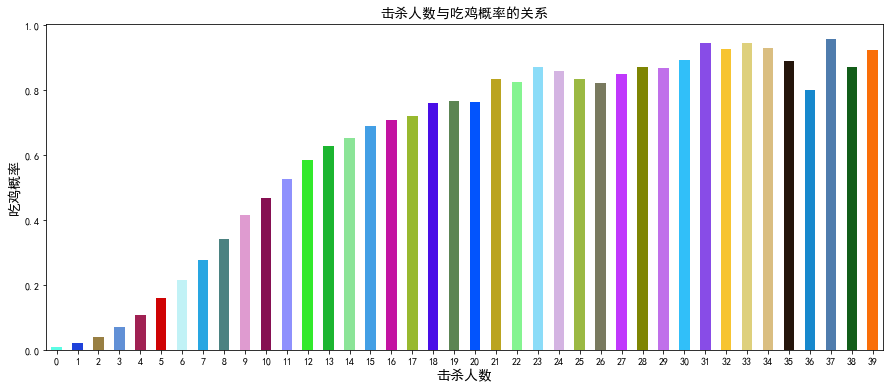

In [13]:
slay.loc[slay['player_kills'] < 40, ['player_kills', 'won']].groupby('player_kills').won.mean().plot.bar(figsize=(15,6), rot=0, color=np.random.rand(100,3))
plt.xlabel('击杀人数', fontsize=14)
plt.ylabel("吃鸡概率", fontsize=14)
plt.title('击杀人数与吃鸡概率的关系', fontsize=14)
plt.savefig('./击杀人数与吃鸡概率的关系',dpi=100)

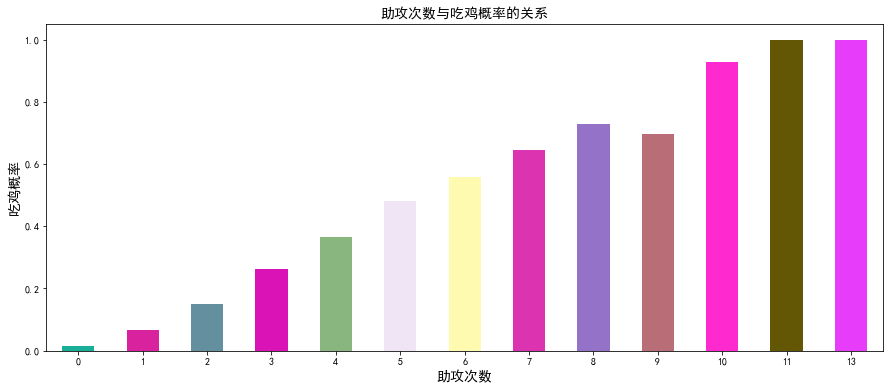

In [15]:
slay.loc[slay['party_size']!=1, ['player_assists', 'won']].groupby('player_assists').won.mean().plot.bar(figsize=(15,6), rot=0
                                                                                                        , color=np.random.rand(100,3))
plt.xlabel('助攻次数', fontsize=14)
plt.ylabel("吃鸡概率", fontsize=14)
plt.title('助攻次数与吃鸡概率的关系', fontsize=14)
plt.savefig('./助攻次数与吃鸡概率的关系',dpi=100)

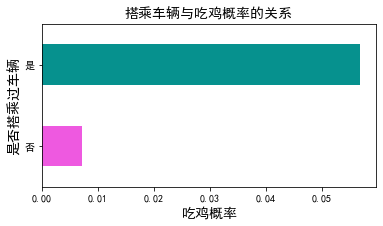

In [19]:
slay.groupby('drove').won.mean().plot.barh(figsize=(6,3), color=np.random.rand(10,3))
plt.xlabel("吃鸡概率", fontsize=14)
plt.ylabel("是否搭乘过车辆", fontsize=14)
plt.title('搭乘车辆与吃鸡概率的关系', fontsize=14)
plt.yticks([1,0],['是','否'])
plt.savefig('./搭乘车辆与吃鸡概率的关系',dpi=100)

In [20]:
dist_ride = slay.loc[slay['player_dist_ride']<12000, ['player_dist_ride', 'won']]
labels=["0-1k", "1-2k", "2-3k", "3-4k","4-5k", "5-6k", "6-7k", "7-8k", "8-9k", "9-10k", "10-11k", "11-12k"]
dist_ride['drove_cut'] = pd.cut(dist_ride['player_dist_ride'], 12, labels=labels)

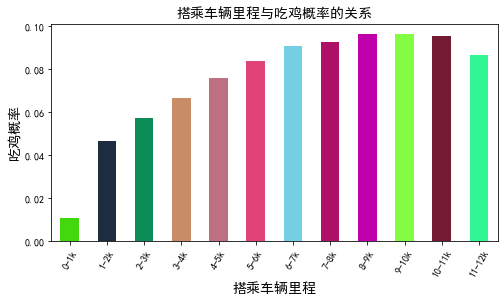

In [21]:
dist_ride.groupby('drove_cut').won.mean().plot.bar(rot=60, figsize=(8,4), color=np.random.rand(30,3))
plt.xlabel("搭乘车辆里程", fontsize=14)
plt.ylabel("吃鸡概率", fontsize=14)
plt.title('搭乘车辆里程与吃鸡概率的关系', fontsize=14)
plt.savefig('./搭乘车辆里程与吃鸡概率的关系',dpi=100)

In [22]:
match_unique = slay.loc[slay['party_size'] == 1, 'match_id'].unique()
match_unique

array(['2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzLToAhG5PWG043VgsrJm',
       '2U4GBNA0YmnMiL8FxzK-xRalmDs8__VvvNzmntjlIzBi0DttiOYQ5ltAx4LN3Q0q',
       '2U4GBNA0YmnNOKktVk9Qv5ZxUnnxXk1-kUI03yF8vbYyzdTaiA36TPjP5mJ01mkE',
       ...,
       '2U4GBNA0YmliJxbJFgg05prkjUCEhGSBwDUNOii8tyJrijqG2YF2fPnPcigbRHps',
       '2U4GBNA0Ymn7HTWF33xgPF2UiISHJZG4LZFZMnJBPaAk2IRggmX8fwXNl8zqlEsj',
       '2U4GBNA0Ymmc9UpDOv0XhgxBsJt2T_OPsK4N0ZOl7_GV1DYSyNnkUK9-N8pdVJHt'],
      dtype=object)

In [24]:
death = pd.read_csv('kill_match_stats_final_0.csv')
display(death.shape, death.head())

(13426348, 12)

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,Grenade,KrazyPortuguese,5.0,657725.10,146275.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,657725.10,146275.2
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8


In [26]:
death_solo = death[death['match_id'].isin(match_unique)]
death_solo

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
463,P92,Adlerx,51.0,391919.3,235406.2,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,425,Sventy21,59.0,392289.6,235706.1
464,AKM,CocaCola01,4.0,347226.7,142356.4,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1477,PNW_Franco17,9.0,345692.8,141435.4
465,P18C,jprodigy,85.0,421634.0,324678.9,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,126,Eagyl,86.0,421077.3,324661.9
466,Bluezone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,830,Illudian,69.0,0.0,0.0
467,UMP9,MLBBear,30.0,420148.7,324679.9,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,263,Hastela,71.0,420297.3,326671.7
...,...,...,...,...,...,...,...,...,...,...,...,...
13426069,Mk14,ZG-Xiaoguizu,16.0,373721.3,315656.2,ERANGEL,2U4GBNA0Ymmc9UpDOv0XhgxBsJt2T_OPsK4N0ZOl7_GV1D...,1473,BWM158,18.0,363116.8,333291.9
13426070,Kar98k,scribble-777,21.0,321419.4,448216.4,ERANGEL,2U4GBNA0Ymmc9UpDOv0XhgxBsJt2T_OPsK4N0ZOl7_GV1D...,1191,syamu_game00,27.0,285248.8,455145.8
13426071,UMP9,wellln,4.0,330754.5,351915.6,ERANGEL,2U4GBNA0Ymmc9UpDOv0XhgxBsJt2T_OPsK4N0ZOl7_GV1D...,1680,DaGeGe886,7.0,330957.2,353792.2
13426072,Kar98k,XeonExceldus,9.0,558382.3,585716.7,ERANGEL,2U4GBNA0Ymmc9UpDOv0XhgxBsJt2T_OPsK4N0ZOl7_GV1D...,585,huya-ilu7i,47.0,553496.6,591034.3


In [27]:
death_solo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2818962 entries, 463 to 13426073
Data columns (total 12 columns):
killed_by            object
killer_name          object
killer_placement     float64
killer_position_x    float64
killer_position_y    float64
map                  object
match_id             object
time                 int64
victim_name          object
victim_placement     float64
victim_position_x    float64
victim_position_y    float64
dtypes: float64(6), int64(1), object(5)
memory usage: 279.6+ MB


In [29]:
# 存活不超过2分钟的玩家 落地成盒 ahh
death_120_seconds_erg = death_solo.loc[(death_solo['map'] == 'ERANGEL')&(death_solo['time'] < 120)&
                                        (death_solo['victim_position_x']>0), :].dropna()
death_120_seconds_mrm = death_solo.loc[(death_solo['map'] == 'MIRAMAR')&(death_solo['time'] < 120)&
                                        (death_solo['victim_position_x']>0), :].dropna()
display(death_120_seconds_erg.shape, death_120_seconds_mrm.shape)

(198813, 12)

(45598, 12)

In [30]:
# 选择存活不过120秒的玩家死亡位置
data_erg = death_120_seconds_erg[['victim_position_x', 'victim_position_y']].values
data_mrm = death_120_seconds_mrm[['victim_position_x', 'victim_position_y']].values

In [31]:
# 重新scale玩家位置
data_erg = data_erg*4096/800000
data_mrm = data_mrm*1000/800000

In [42]:
from scipy.ndimage.filters import gaussian_filter
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import cv2
from skimage import io

In [34]:
# 定位函数
def heatmap(x, y, s, bins=100):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)

    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

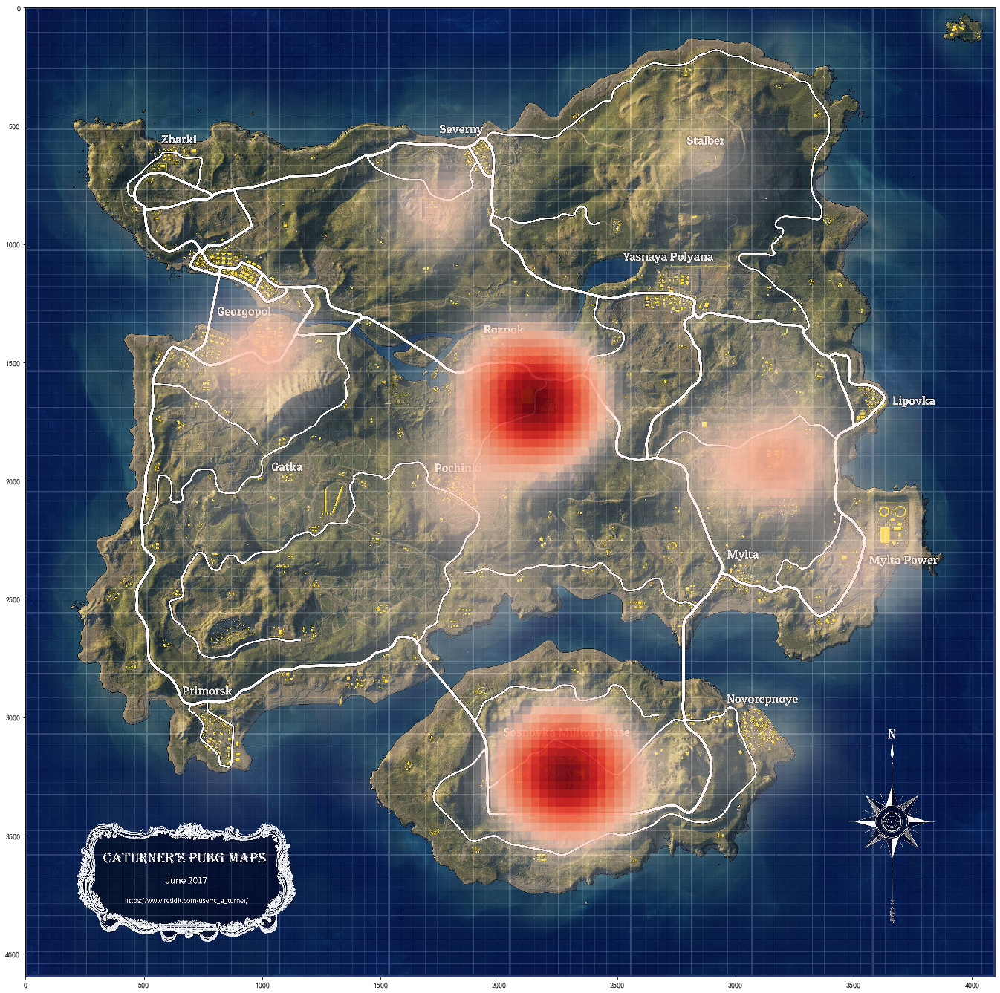

In [43]:
bg = io.imread('erangel.jpg')
hmap, extent = heatmap(data_erg[:,0], data_erg[:,1], 4.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*4.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
plt.gca().invert_yaxis()
plt.savefig('./落地成盒',dpi=100)

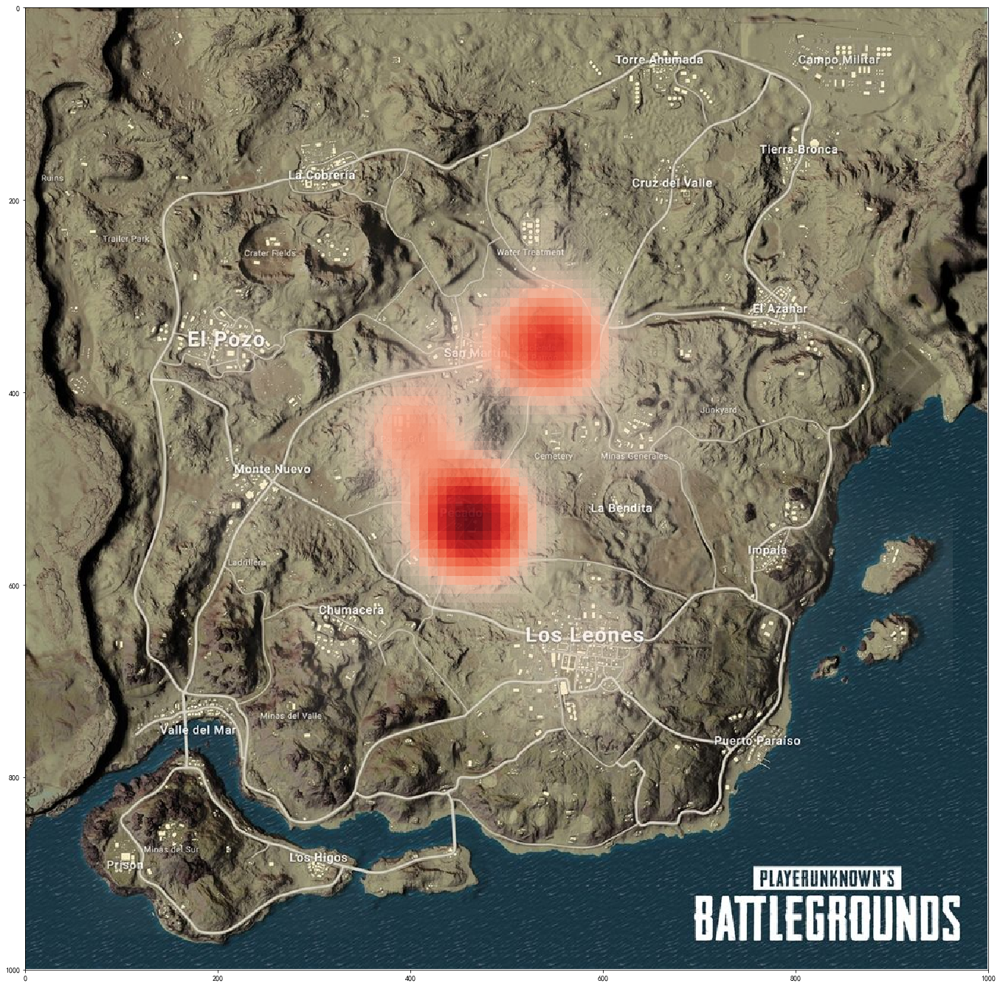

In [44]:
bg = io.imread('miramar.jpg')
hmap, extent = heatmap(data_mrm[:,0], data_mrm[:,1], 4)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*4, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 1000); ax.set_ylim(0, 1000)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
plt.gca().invert_yaxis()
plt.savefig('./落地成盒_沙漠',dpi=100)

In [45]:
# 毒区在那
death_final_circle_erg = death_solo.loc[(death_solo['map'] == 'ERANGEL')&(death_solo['victim_placement'] == 2)&
                                        (death_solo['victim_position_x']>0)&(death_solo['killer_position_x']>0), :].dropna()
death_final_circle_mrm = death_solo.loc[(death_solo['map'] == 'MIRAMAR')&(death_solo['victim_placement'] == 2)&
                                        (death_solo['victim_position_x']>0)&(death_solo['killer_position_x']>0), :].dropna()
display(death_final_circle_erg.shape, death_final_circle_mrm.shape)

(23722, 12)

(4767, 12)

In [46]:

final_circle_erg = np.vstack([death_final_circle_erg[['victim_position_x', 'victim_position_y']].values, 
                                    death_final_circle_erg[['killer_position_x', 'killer_position_y']].values])*4096/800000
final_circle_mrm = np.vstack([death_final_circle_mrm[['victim_position_x', 'victim_position_y']].values,
                                    death_final_circle_mrm[['killer_position_x', 'killer_position_y']].values])*1000/800000

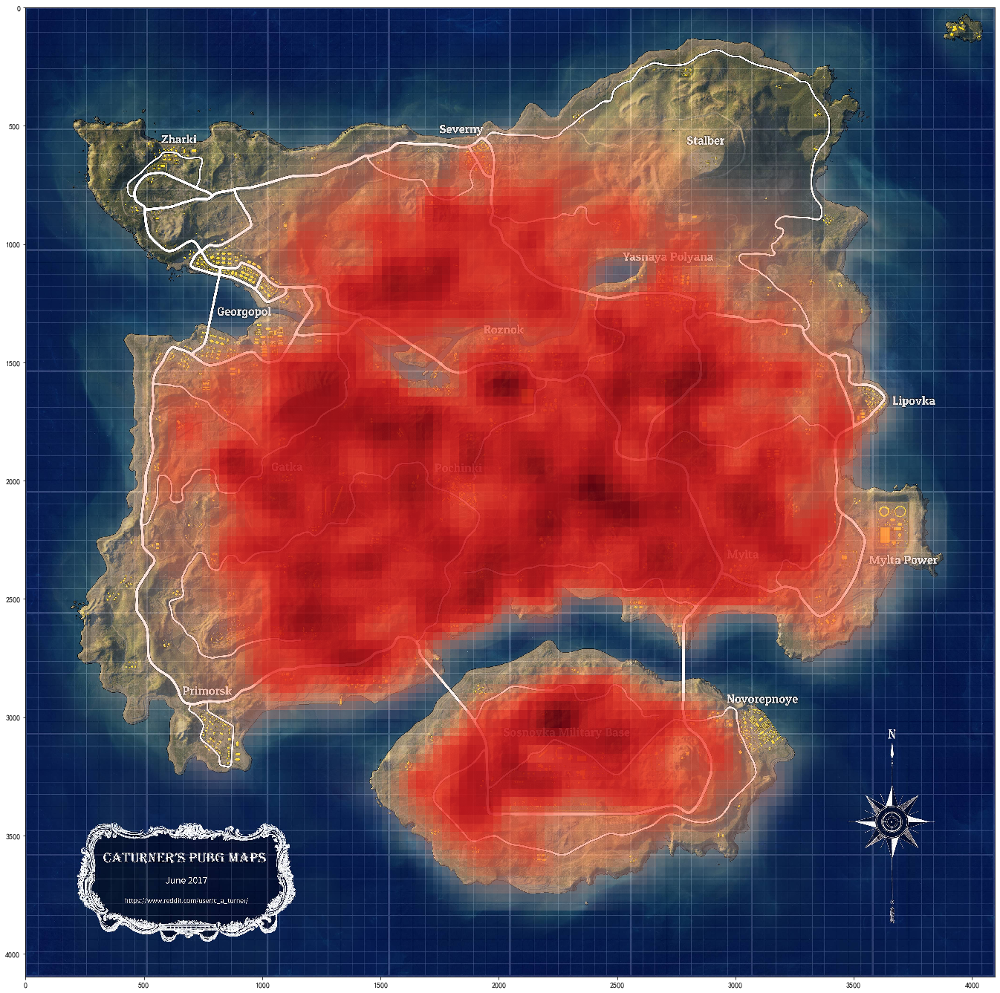

In [48]:
bg = io.imread('erangel.jpg')
hmap, extent = heatmap(final_circle_erg[:,0], final_circle_erg[:,1], 1.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*1.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
plt.gca().invert_yaxis()
plt.savefig('./毒区',dpi=100)

In [49]:
erg_died_of = death.loc[(death['map']=='ERANGEL')&(death['killer_position_x']>0)&
                        (death['victim_position_x']>0)&(death['killed_by']!='Down and Out'),:]
mrm_died_of = death.loc[(death['map']=='MIRAMAR')&(death['killer_position_x']>0)&
                        (death['victim_position_x']>0)&(death['killed_by']!='Down and Out'),:]
display(erg_died_of.shape, mrm_died_of.shape)

(8137147, 12)

(1772692, 12)

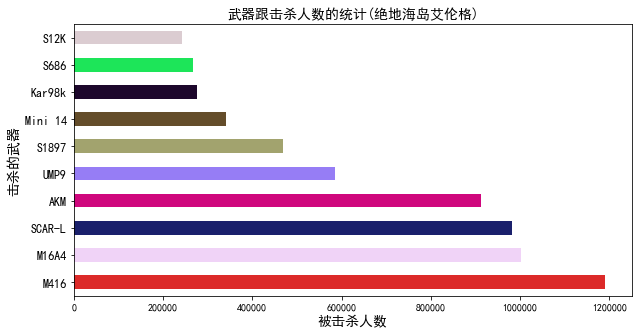

In [50]:
erg_died_of['killed_by'].value_counts()[:10].plot.barh(figsize=(10,5), color=np.random.rand(100,3))
plt.xlabel("被击杀人数", fontsize=14)
plt.ylabel("击杀的武器", fontsize=14)
plt.title('武器跟击杀人数的统计(绝地海岛艾伦格)', fontsize=14)
plt.yticks(fontsize=12)
plt.savefig('./武器跟击杀人数的统计',dpi=100)

In [53]:
# 把位置信息转换成距离，以“米”为单位
erg_distance = np.sqrt(((erg_died_of['killer_position_x']-erg_died_of['victim_position_x'])/100)**2 + 
                       ((erg_died_of['killer_position_y']-erg_died_of['victim_position_y'])/100)**2)
mrm_distance = np.sqrt(((mrm_died_of['killer_position_x']-mrm_died_of['victim_position_x'])/100)**2 + 
                       ((mrm_died_of['killer_position_y']-mrm_died_of['victim_position_y'])/100)**2)

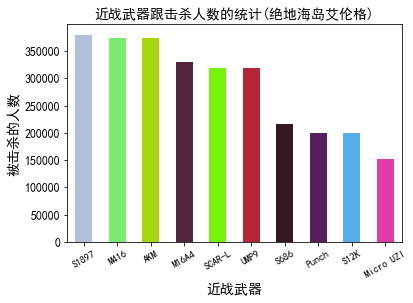

In [59]:
# 近战武器
erg_died_of.loc[erg_distance<10, 'killed_by'].value_counts()[:10].plot.bar(rot=30, color=np.random.rand(50,3))
plt.xlabel("近战武器", fontsize=14)
plt.ylabel("被击杀的人数", fontsize=14)
plt.title('近战武器跟击杀人数的统计(绝地海岛艾伦格)', fontsize=14)
plt.yticks(fontsize=12)
plt.savefig('./近战武器',dpi=100)